<a href="https://colab.research.google.com/github/akshatdalton/AI-Expert-Roadmap/blob/main/src/DIP_Project.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
%cd dip-project-blender/

/content/dip-project-blender


In [ ]:
!git fetch
!git rebase

In [16]:
import cv2
import numpy as np
import scipy.misc
import pywt
from skimage.transform import pyramids, pyramid_gaussian, pyramid_laplacian
from matplotlib import pyplot as plt
from numba import jit

from os import listdir, path

In [47]:
image_dataset = []

ABSOLUTE_PATH = "./images"
for img_path in listdir(ABSOLUTE_PATH):
    image_dataset.append(cv2.resize(cv2.imread(path.join(ABSOLUTE_PATH, img_path), 0), (256, 256)))

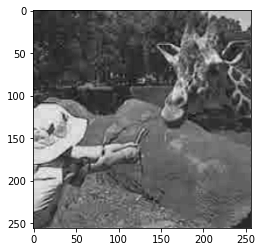

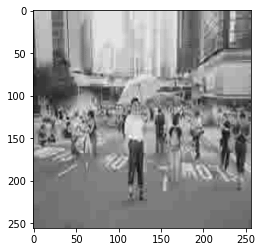

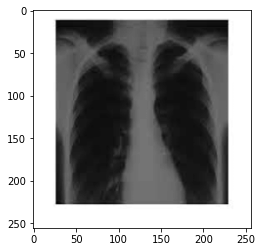

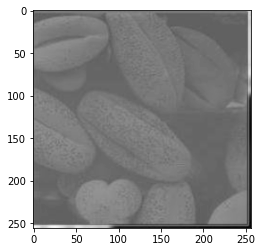

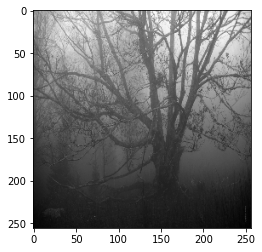

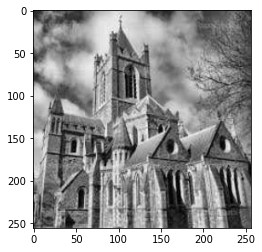

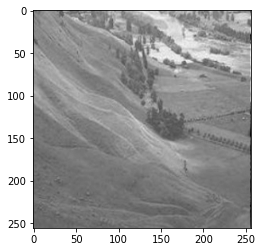

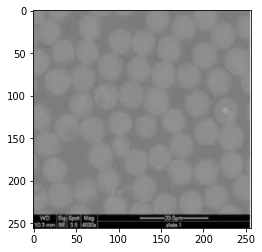

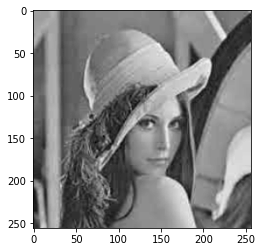

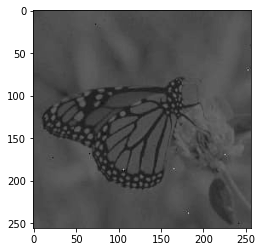

In [48]:
for img in image_dataset:
    plt.figure()
    plt.imshow(img, cmap="gray")

In [24]:
def normalize(img):
    mx = np.amax(img)
    img /= mx
    img *= 255
    img = img.astype(np.uint8)
    return img

In [60]:
class Base(object):
    def __init__(self, img, stage=5):
        self.img = img
        self.result = None
        self.before_img_pyramid = []
        self.after_img_pyramid = []
        self.stage = stage
    

    def apply_enhancement(self, img):
        scaling_factor = 255.0 / img.max()
        hist_img = cv2.equalizeHist(np.uint8(img * scaling_factor)) / scaling_factor

        U, s, Vth = np.linalg.svd(img)
        Ul, sl, Vlth = np.linalg.svd(hist_img)

        E = np.max(sl) / np.max(s)
        alpha = (E + 1 / E) / 4
        S = alpha * ((E * s) + (sl / E))
        sigma = np.diag(S)

        enhanced_img = U @ sigma @ Vth
        return enhanced_img


    def transform(self, img):
        raise NotImplementedError("This method must be implmented by the subclass")

    
    def get_result(self):
        self.result = self.transform(self.img)

class DCTPyramidal(Base):
    def transform(self, img):
        if img.size == 1 or self.stage == 0:
            return img
        self.stage -= 1
        img_dct = dct2d(img)
        h, w = img_dct.shape

        LL = img_dct[:h//2, :w//2]
        img_LL = idct2d(LL)
        enhanced_img_LL = self.transform(img_LL)
        enhanced_img_LL_dct = dct2d(enhanced_img_LL)

        img_dct[:h//2, :w//2] = enhanced_img_LL_dct
        img = idct2d(img_dct)
        img = self.apply_enhancement(img)
        return img

In [29]:
def upsample(img):
    res = pyramids.pyramid_expand(img, sigma=None)
    return res

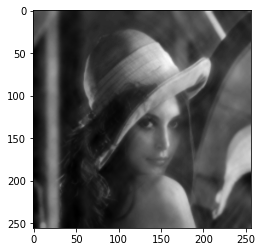

In [ ]:
model = DCTPyramidal(lena_dark,stage=5)
img = model.get_result()
plt.imshow(img, cmap="gray")

Text(0.5, 1.0, 'Original Image')

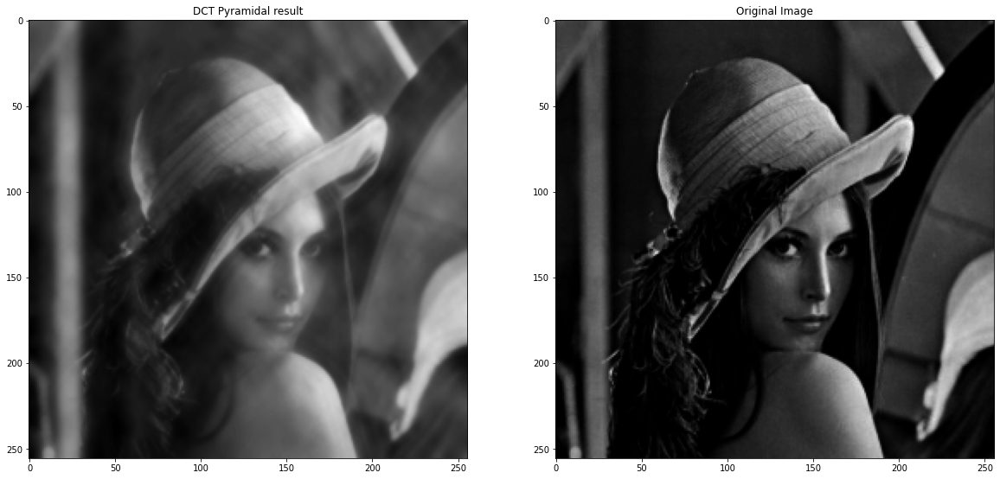

In [ ]:
plt.figure(figsize=(20,20))
plt.subplot(1, 2, 1)
plt.imshow(img, cmap="gray")
plt.title("DCT Pyramidal result")

plt.subplot(1, 2, 2)
plt.imshow(lena_dark, cmap="gray")
plt.title("Original Image")

In [61]:
class DWTPyramidal(Base):
    def transform(self, img):
        if img.size == 1 or self.stage == 0:
            return img
        self.stage -= 1

        coeffs2 = pywt.dwt2(img, "bior1.3")
        LL, (LH, HL, HH) = coeffs2
        enhanced_LL = self.transform(LL)

        coeffs2 = enhanced_LL, (LH, HL, HH)

        ret = pywt.idwt2(coeffs2, "bior1.3")
        ret = self.apply_enhancement(ret)
        ret = ret[:img.shape[0], :img.shape[1]]
        return ret

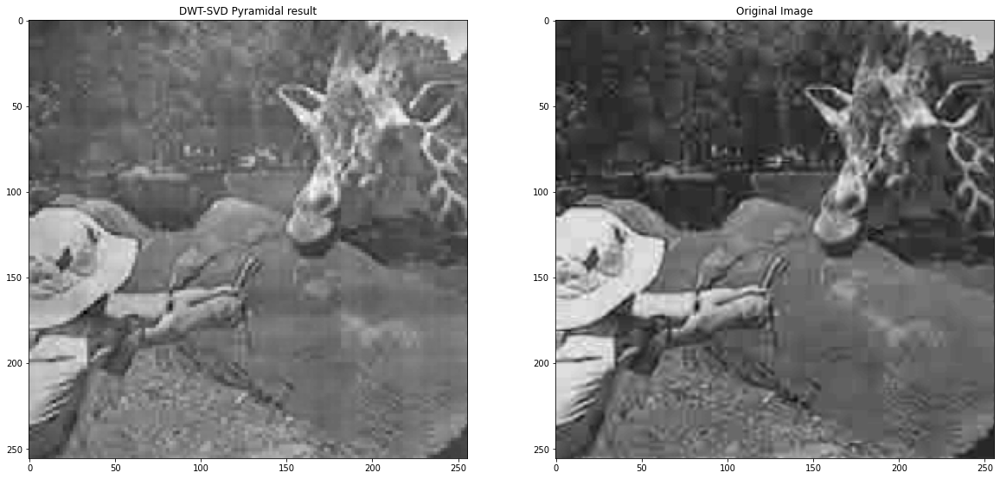

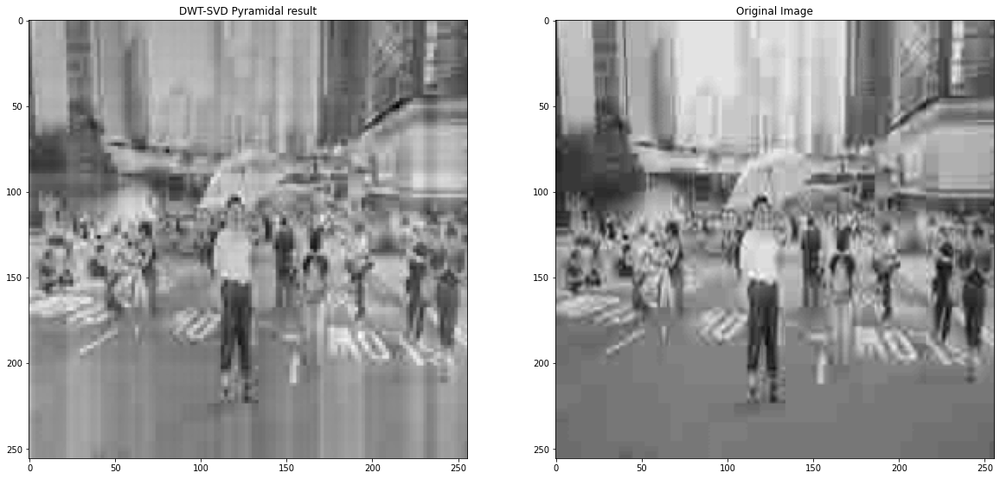

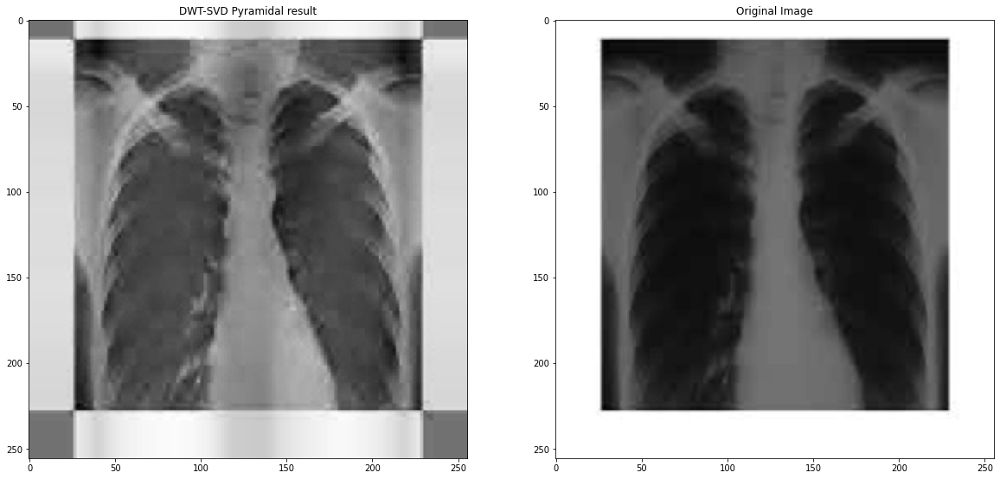

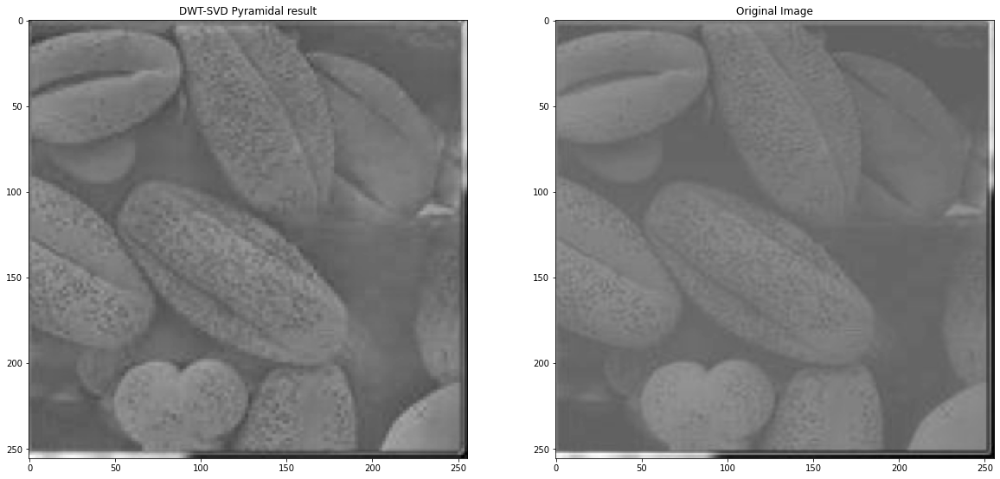

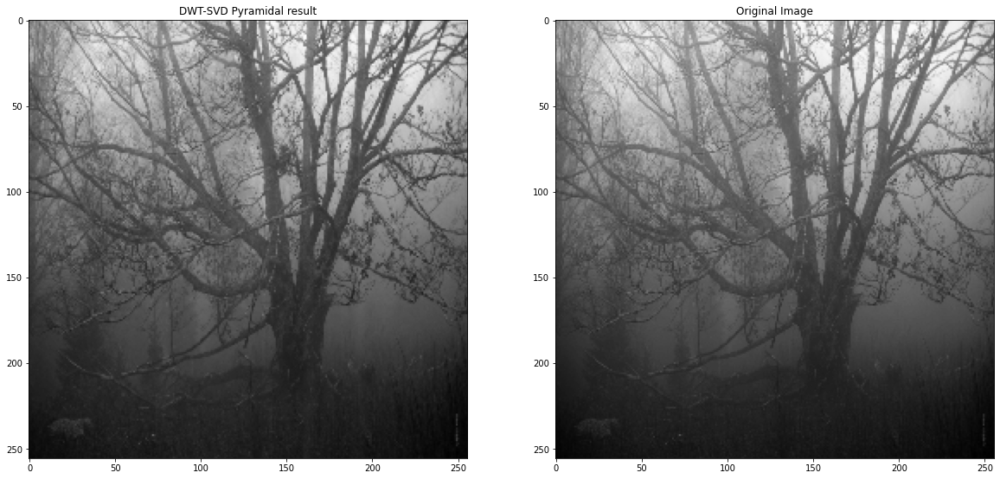

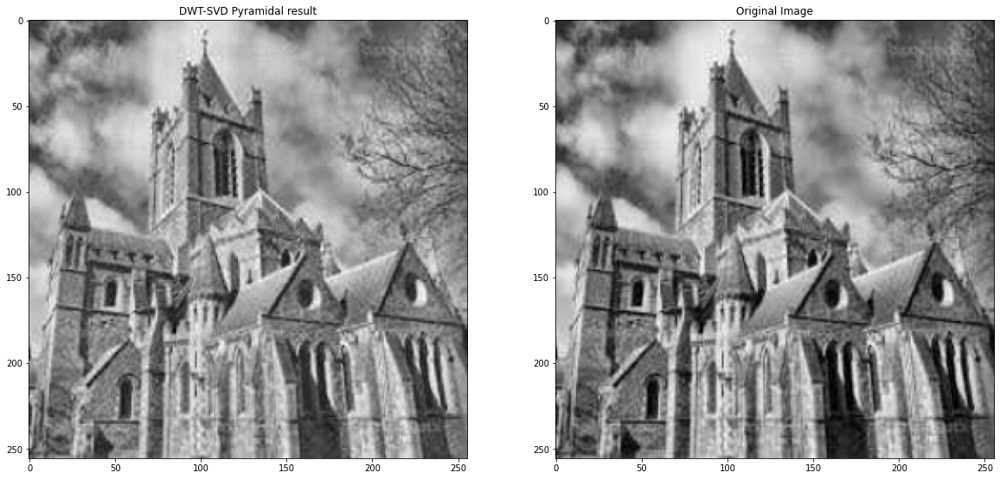

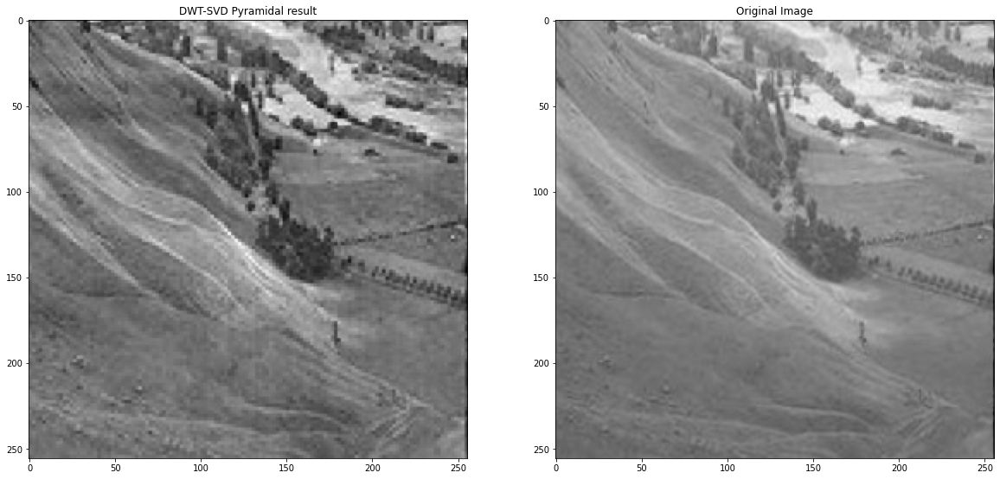

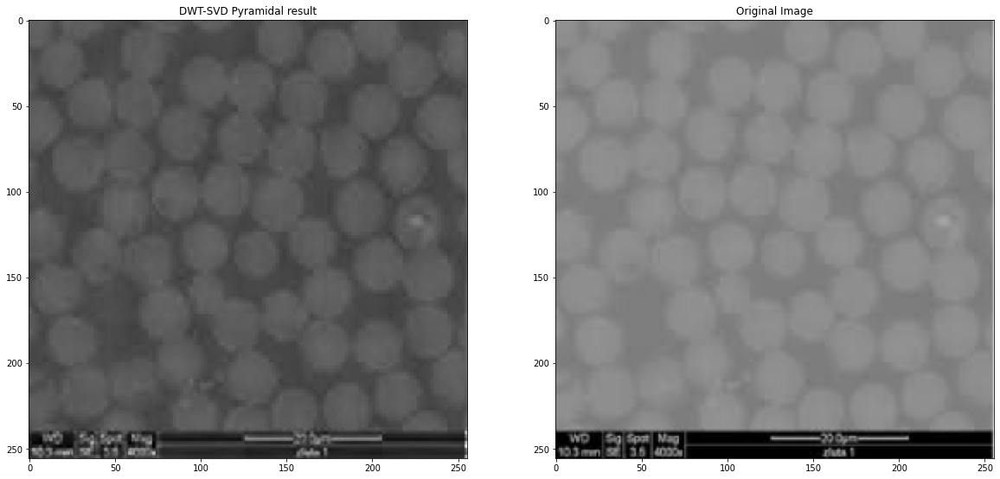

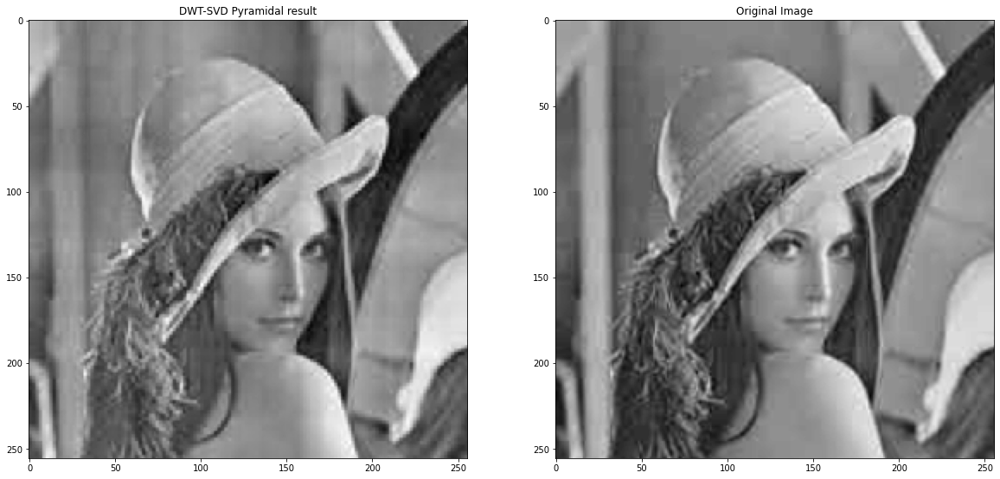

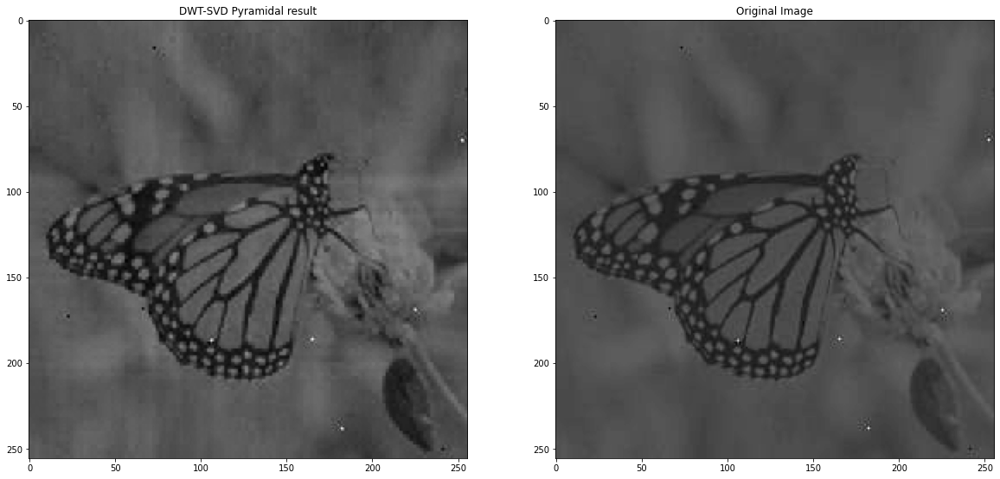

In [62]:
for img in image_dataset:
    model = DWTPyramidal(img, 2)
    model.get_result()

    plt.figure(figsize=(20,20))
    plt.subplot(1, 2, 1)
    plt.imshow(model.result, cmap="gray")
    plt.title("DWT-SVD Pyramidal result")

    plt.subplot(1, 2, 2)
    plt.imshow(model.img, cmap="gray")
    plt.title("Original Image")

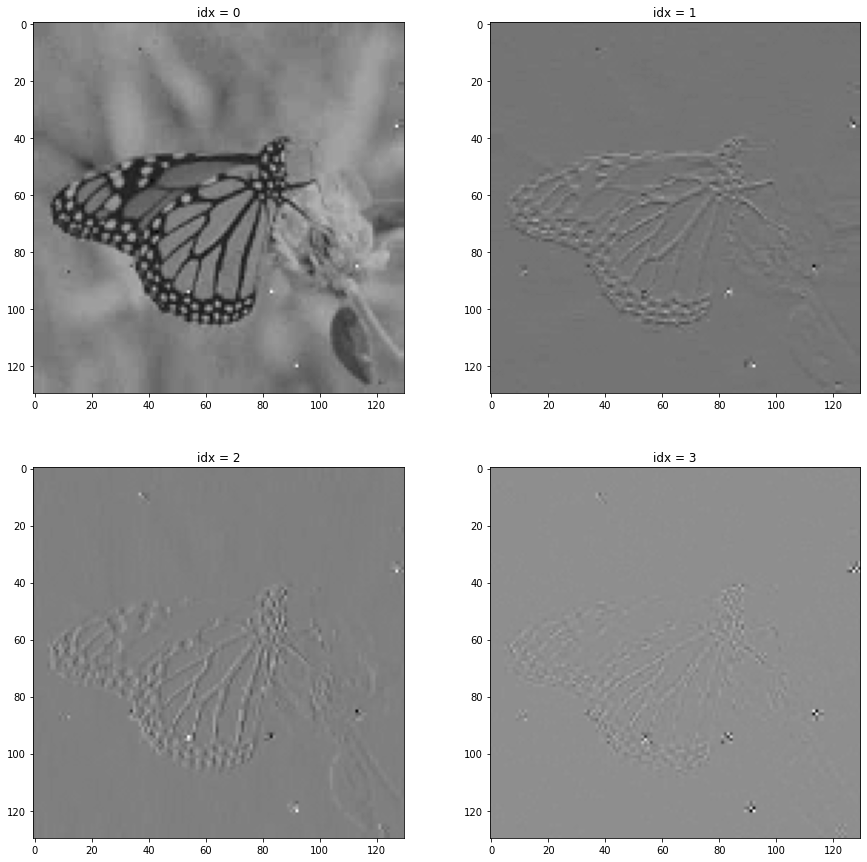

In [63]:
coeffs2 = pywt.dwt2(image_dataset[-1], 'bior1.3')
LL, (LH, HL, HH) = coeffs2

plt.figure(figsize=(15,15))
for idx, img in enumerate([LL, LH, HL, HH]):
    plt.subplot(2, 2, idx + 1)
    plt.imshow(img, cmap="gray")
    plt.title(f"idx = {idx}")

Text(0.5, 1.0, 'Laplacian Image')

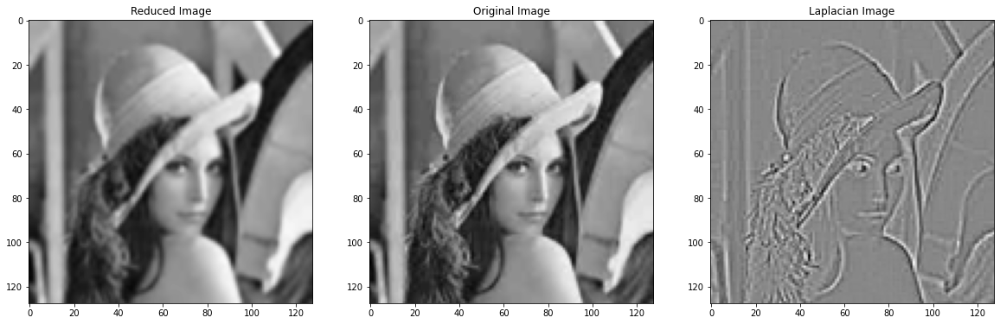

In [66]:
reduced = pyramids.pyramid_reduce(image_dataset[-2], sigma=None)
expanded = pyramids.pyramid_expand(reduced, sigma=None)
red = pyramids.pyramid_reduce(expanded, sigma=None)
diff = red - reduced
plt.figure(figsize=(20,20))
plt.subplot(131)
plt.imshow(red, cmap="gray")
plt.title("Reduced Image")

plt.subplot(132)
plt.imshow(reduced, cmap="gray")
plt.title("Original Image")

plt.subplot(133)
plt.imshow(diff, cmap="gray")
plt.title("Laplacian Image")

### Contrast Enhancement Using SVD and DWT only

In [67]:
class DWTSVD(Base):
    def apply_enhancement(self, img):
        scaling_factor = 255.0 / img.max()
        hist_img = cv2.equalizeHist(np.uint8(img * scaling_factor)) / scaling_factor

        coeffs2_hist = pywt.dwt2(hist_img, "bior1.3")
        LL_hist, _ = coeffs2_hist

        coeffs2 = pywt.dwt2(img, "bior1.3")
        LL, (LH, HL, HH) = coeffs2

        U, s, Vth = np.linalg.svd(LL)
        Ul, sl, Vlth = np.linalg.svd(LL_hist)

        E = np.max(sl) / np.max(s) # theory
        alpha = (E + 1 / E) / 4
        S = alpha * ((E * s) + (sl / E))
        sigma = np.diag(S)

        enhanced_LL = U @ sigma @ Vth

        coeffs2 = enhanced_LL, (LH, HL, HH)
        enhanced_img = pywt.idwt2(coeffs2, "bior1.3")
        return enhanced_img

    def transform(self, img):
        if img.size == 1 or self.stage == 0:
            return self.apply_enhancement(img)
        self.stage -= 1

        ret = self.apply_enhancement(img)
        ret = ret[:img.shape[0], :img.shape[1]]
        return ret

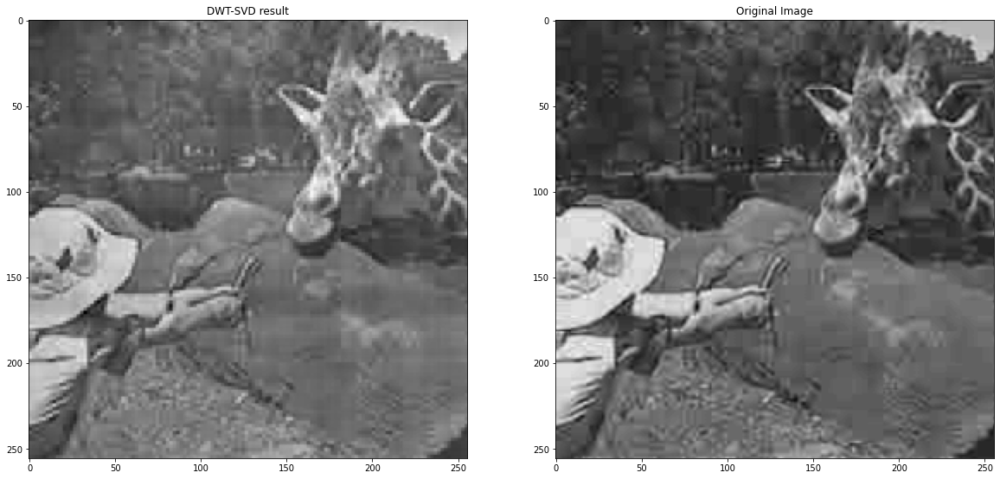

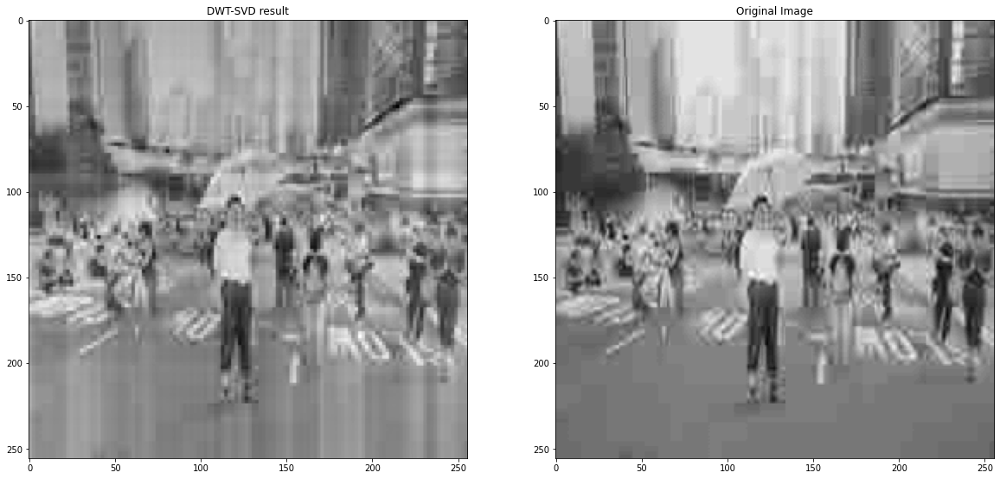

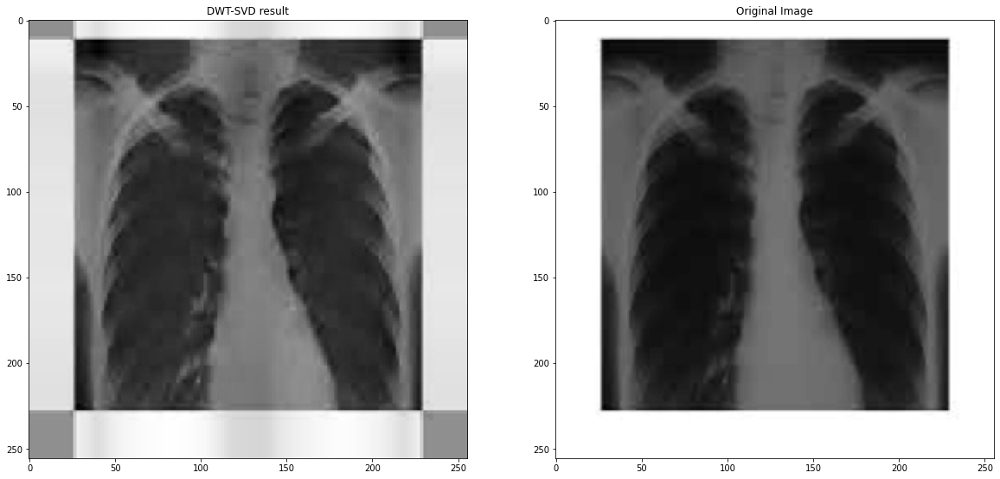

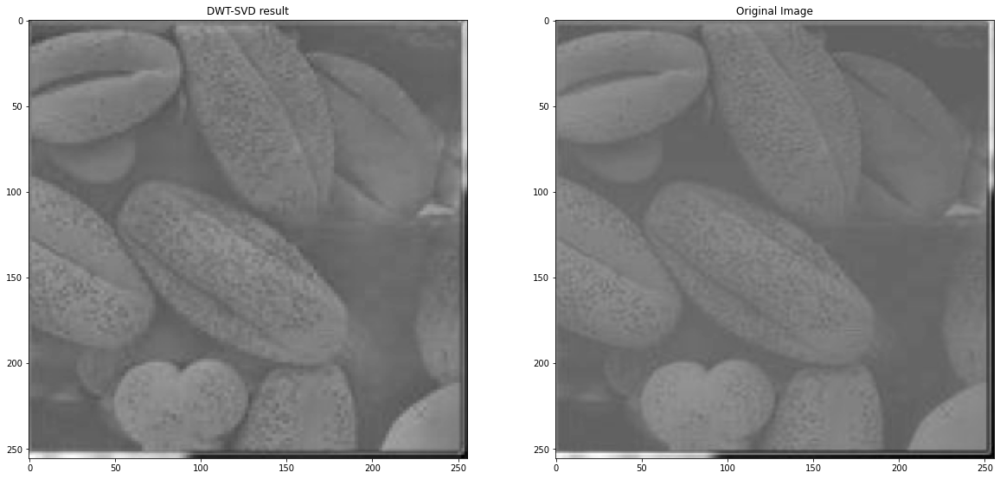

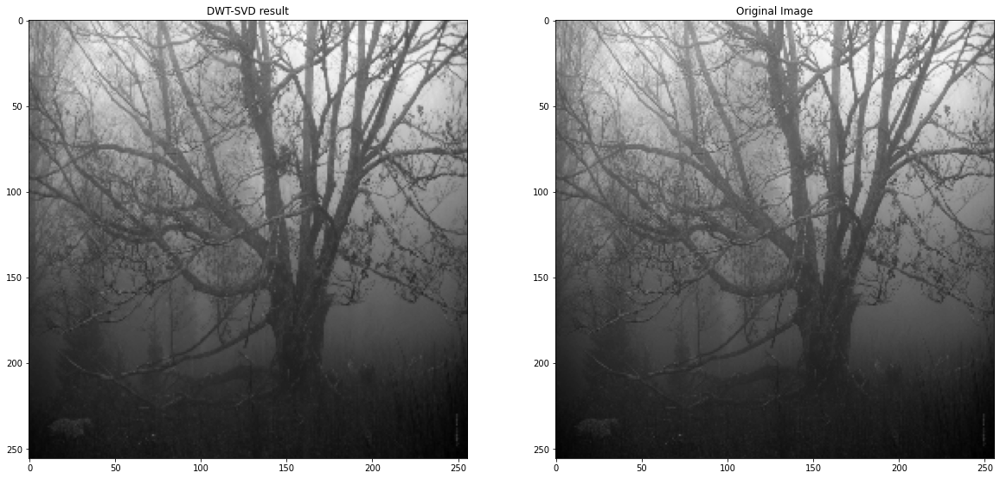

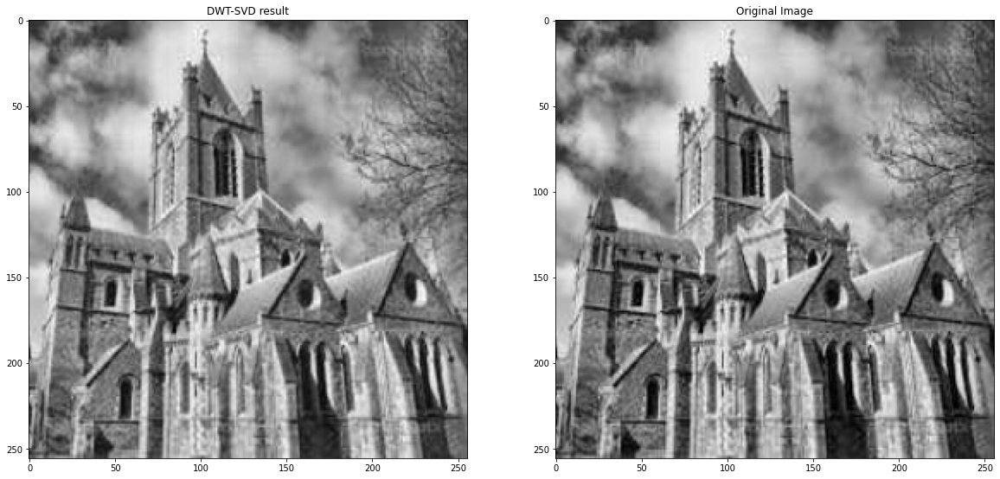

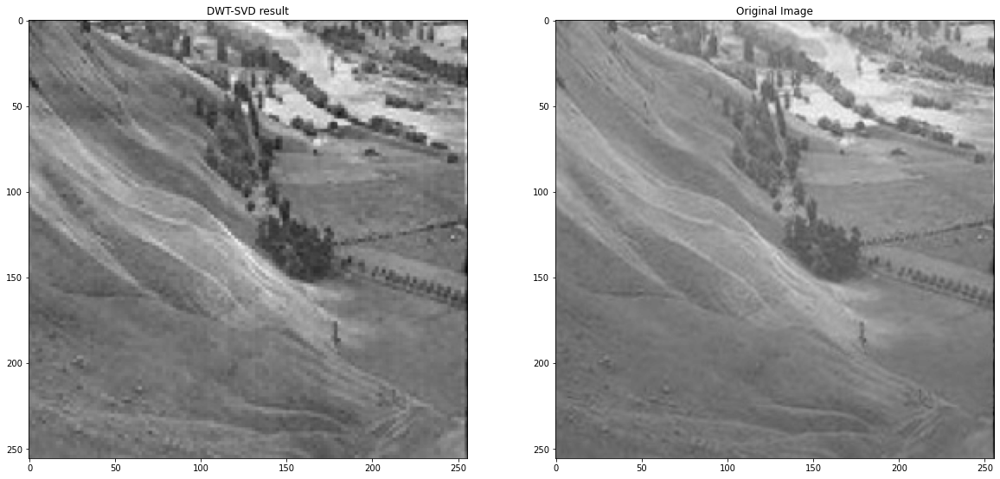

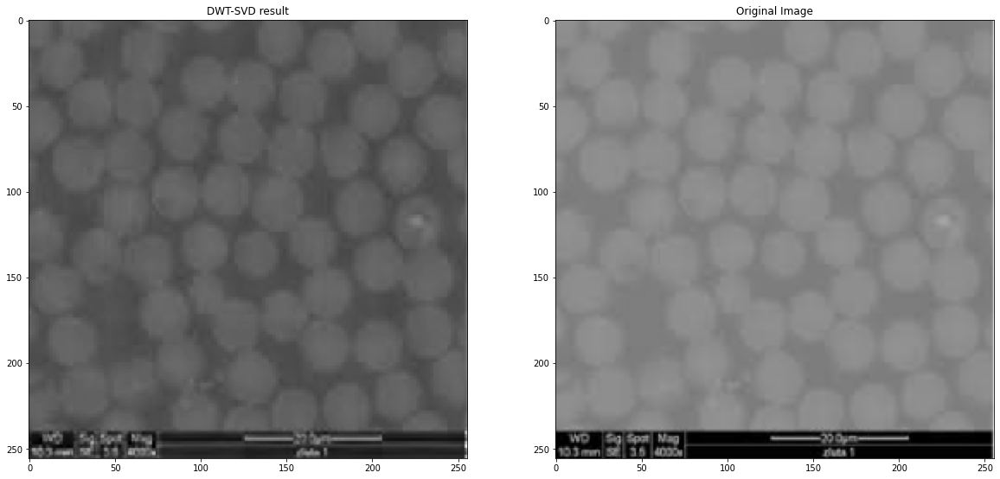

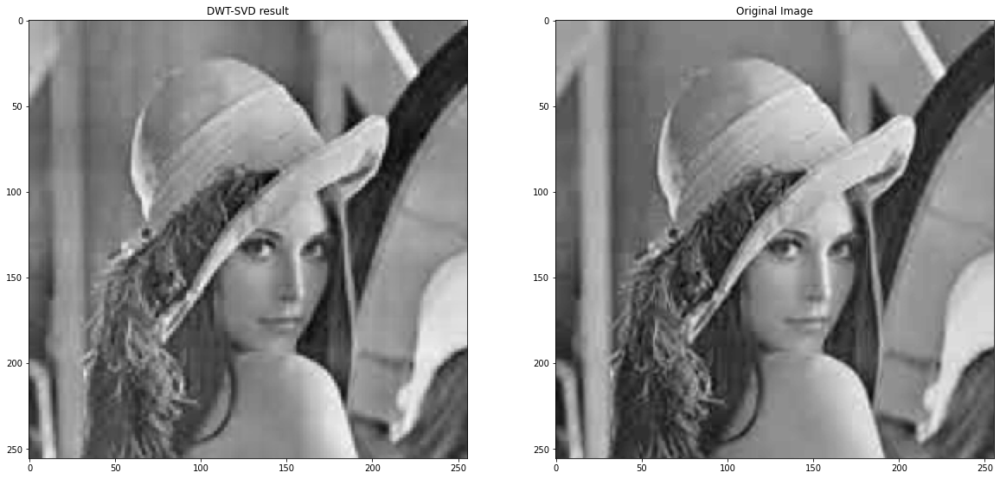

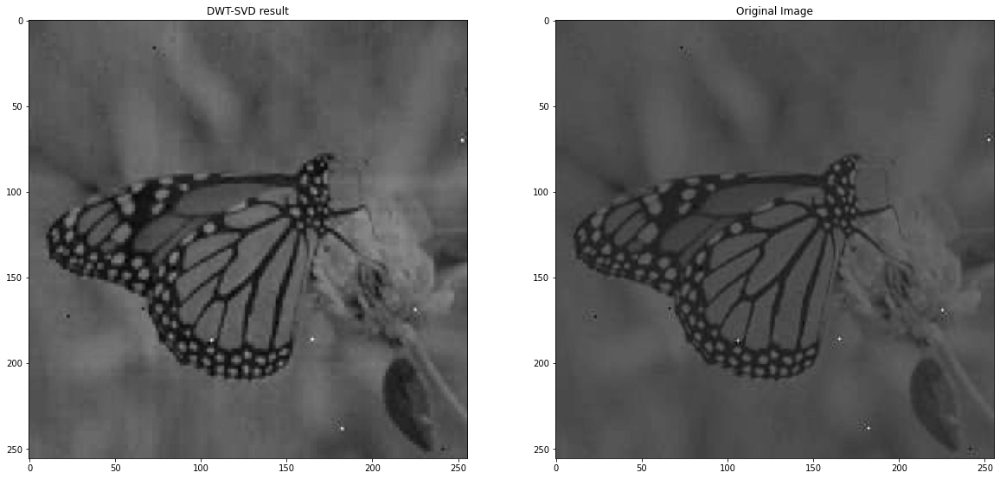

In [69]:
for img in image_dataset:
    model = DWTSVD(img, 2)
    model.get_result()

    plt.figure(figsize=(20,20))
    plt.subplot(1, 2, 1)
    plt.imshow(model.result, cmap="gray")
    plt.title("DWT-SVD result")

    plt.subplot(1, 2, 2)
    plt.imshow(model.img, cmap="gray")
    plt.title("Original Image")

### Gaussian Pyramid with SVD and DWT

In [71]:
class DWTSVDGaussianPyramidal(Base):
    def apply_enhancement(self, img):
        scaling_factor = 255.0 / img.max()
        hist_img = cv2.equalizeHist(np.uint8(img * scaling_factor)) / scaling_factor

        coeffs2_hist = pywt.dwt2(hist_img, "bior1.3")
        LL_hist, _ = coeffs2_hist

        coeffs2 = pywt.dwt2(img, "bior1.3")
        LL, (LH, HL, HH) = coeffs2

        U, s, Vth = np.linalg.svd(LL)
        Ul, sl, Vlth = np.linalg.svd(LL_hist)

        E = np.max(sl) / np.max(s)
        alpha = (E + 1 / E) / 4
        S = alpha * ((E * s) + (sl / E))
        sigma = np.diag(S)

        enhanced_LL = U @ sigma @ Vth

        coeffs2 = enhanced_LL, (LH, HL, HH)
        enhanced_img = pywt.idwt2(coeffs2, "bior1.3")
        return enhanced_img

    def transform(self, img):
        if img.size == 1 or self.stage == 0:
            return self.apply_enhancement(img)
        self.stage -= 1
        img_pyramid = tuple(pyramids.pyramid_gaussian(img))[1]
        
        temp = self.transform(img_pyramid)

        res = pyramids.pyramid_expand(temp, sigma=None)
        ret = (res + img) / 2 # equal contrib for now
        ret = self.apply_enhancement(ret)
        ret = ret[:img.shape[0], :img.shape[1]]
        return ret

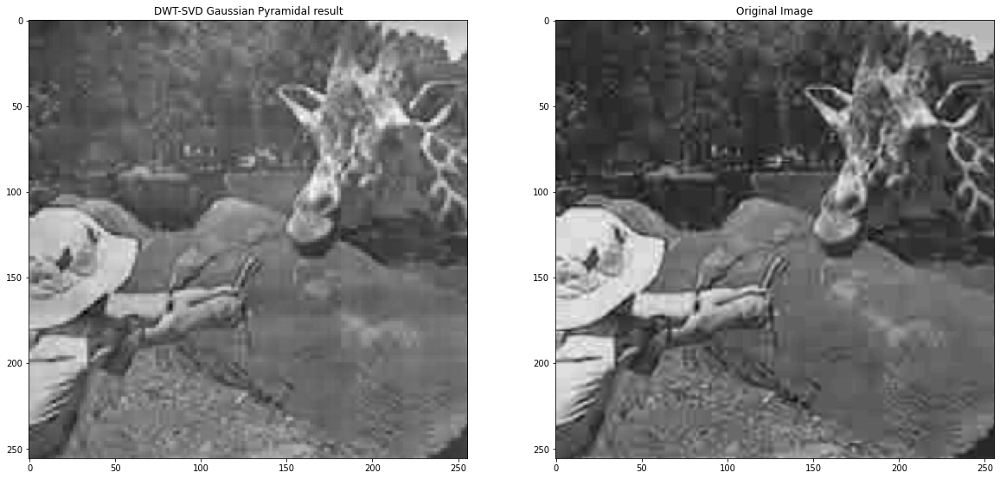

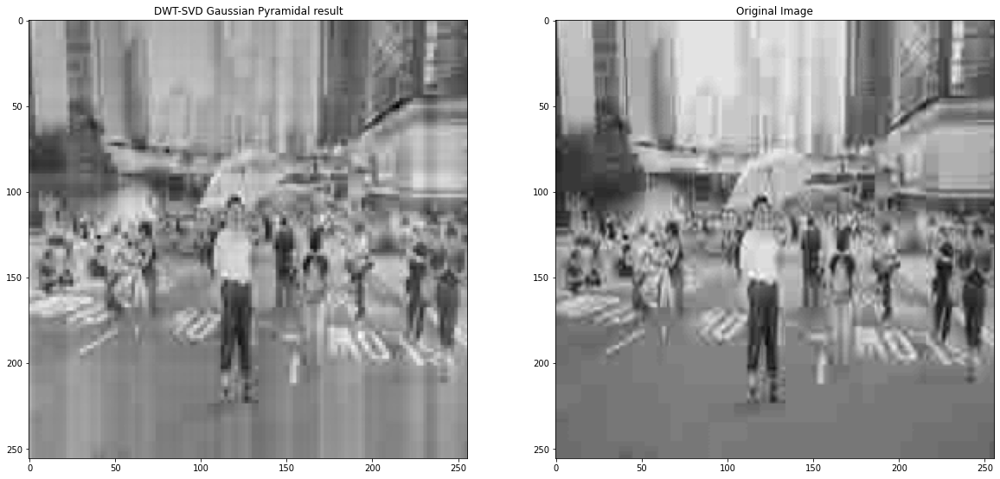

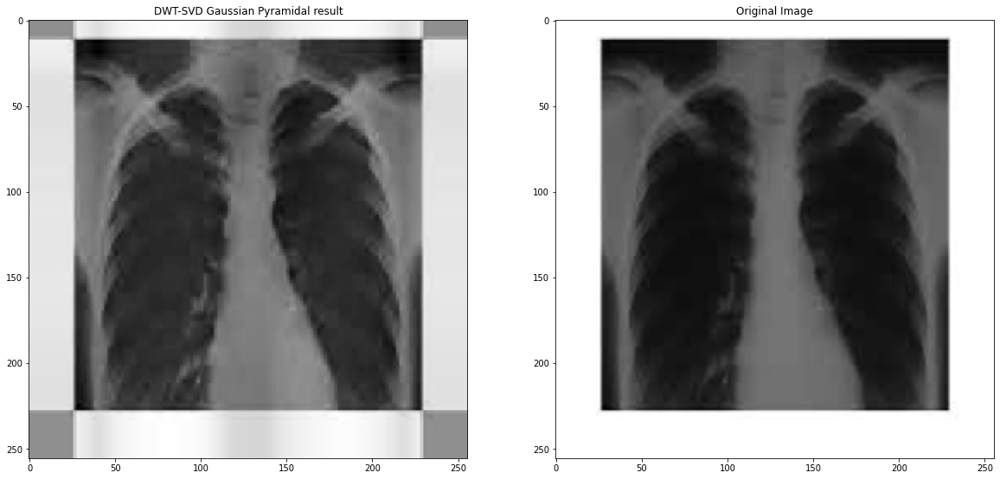

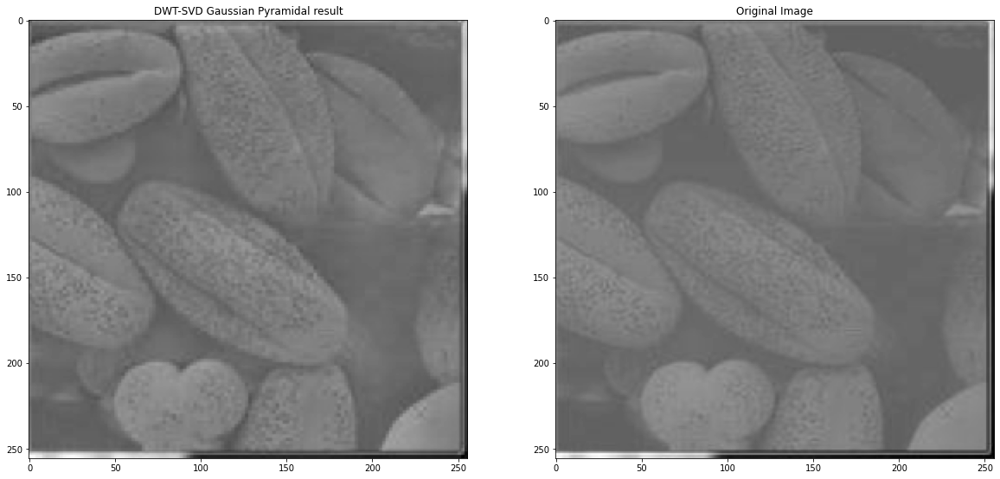

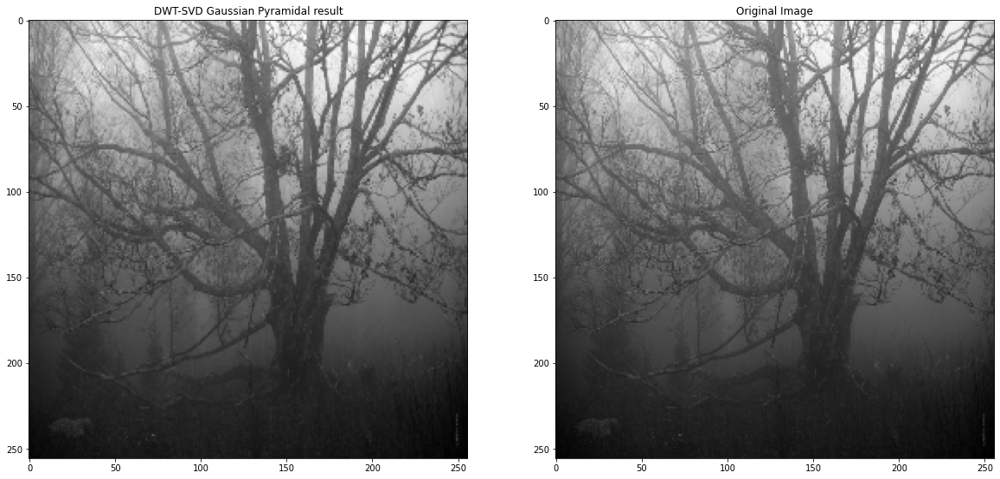

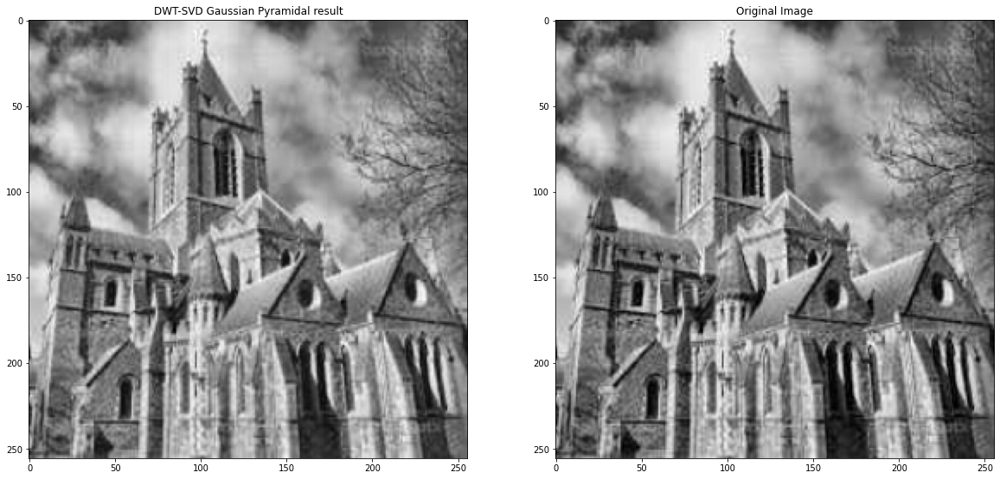

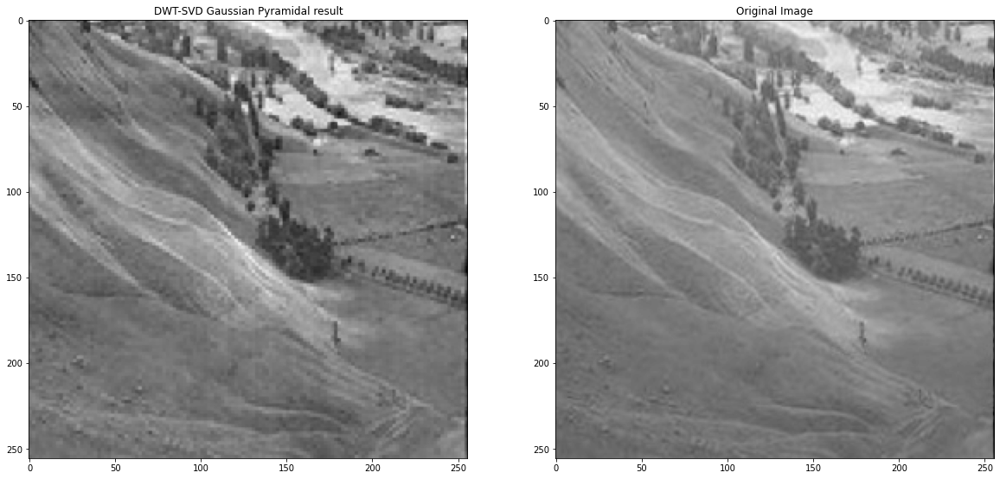

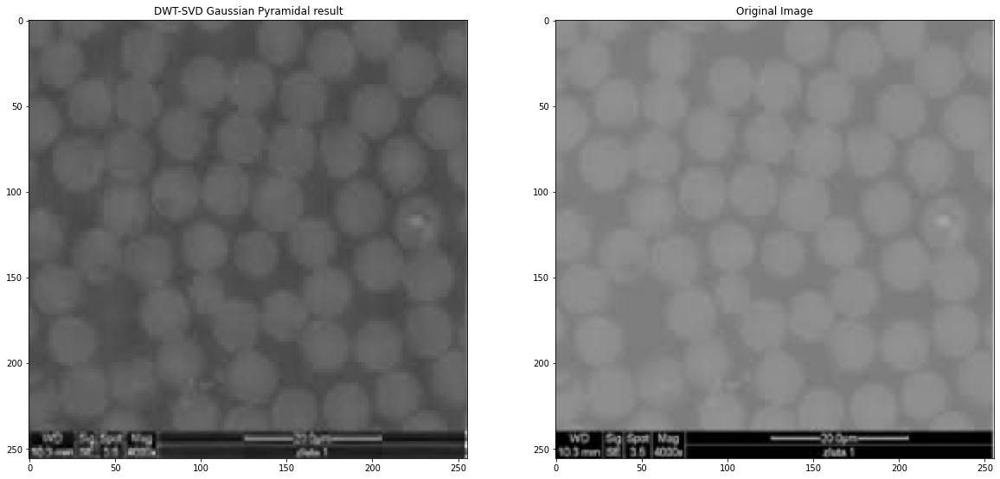

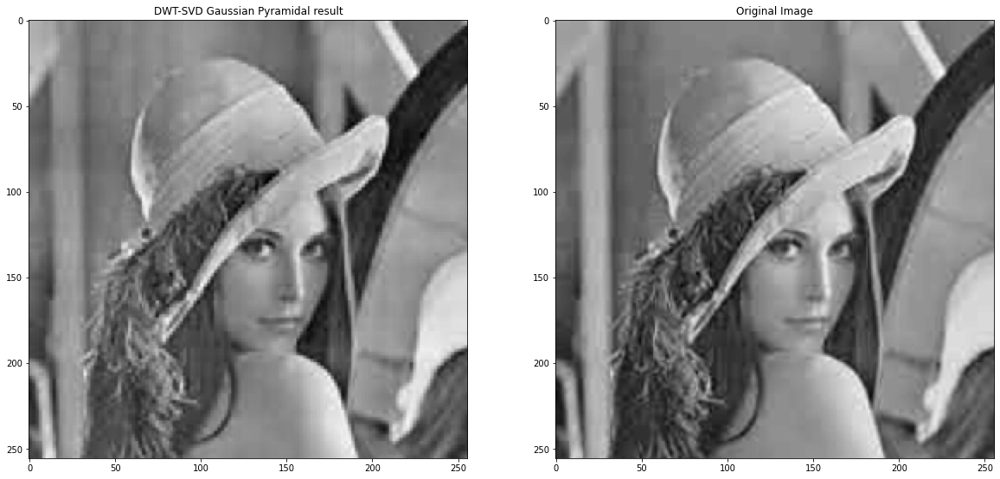

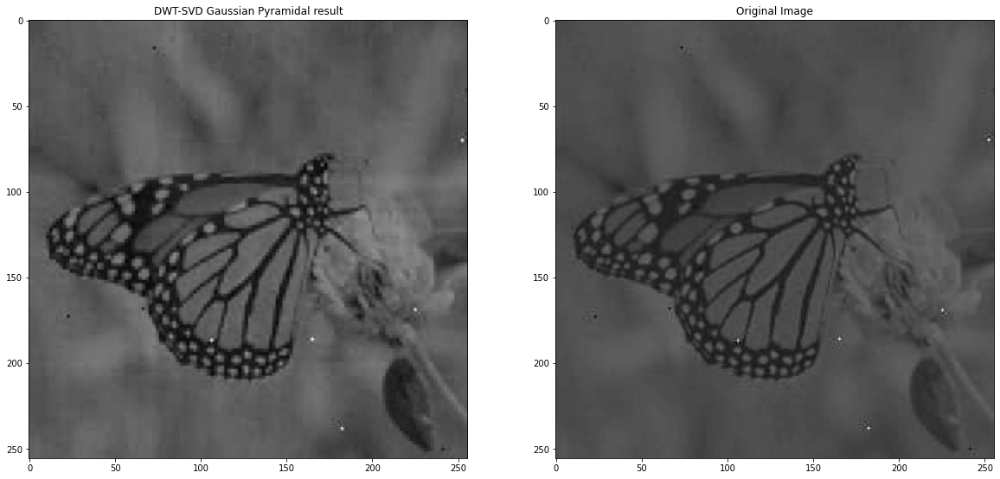

In [73]:
for img in image_dataset:
    model = DWTSVDGaussianPyramidal(img, 2)
    model.get_result()

    plt.figure(figsize=(20,20))
    plt.subplot(1, 2, 1)
    plt.imshow(model.result, cmap="gray")
    plt.title("DWT-SVD Gaussian Pyramidal result")

    plt.subplot(1, 2, 2)
    plt.imshow(model.img, cmap="gray")
    plt.title("Original Image")

### Creating Low Contrast Images

In [ ]:
def linContrastStretching(im,a,b):

    max_im = np.amax(im)
    min_im = np.amin(im)
    im_new = a + (im-min_im)/(max_im-min_im) * (b-a)
    im_new[im_new > 255] = 255

    im_new = im_new.astype(np.uint8)

    return im_new

In [ ]:
lena_bad_1 = linContrastStretching(lena, 0, 100)
lena_bad_2 = linContrastStretching(lena, 50, 150)
lena_bad_3 = linContrastStretching(lena, 150, 250)

lena_rgb_1 = np.stack([lena_bad_1, lena_bad_1, lena_bad_1], axis=2)
lena_rgb_2 = np.stack([lena_bad_2, lena_bad_2, lena_bad_2], axis=2)
lena_rgb_3 = np.stack([lena_bad_3, lena_bad_3, lena_bad_3], axis=2)

### Applying The Technique

In [ ]:
model_1 = DWTGaussianPyramidalSVD(lena_bad_1, 6)
model_2 = DWTGaussianPyramidalSVD(lena_bad_2, 6)
model_3 = DWTGaussianPyramidalSVD(lena_bad_3, 6)

img_1 = model_1.get_result()
img_2 = model_2.get_result()
img_3 = model_3.get_result()

### Showing the results

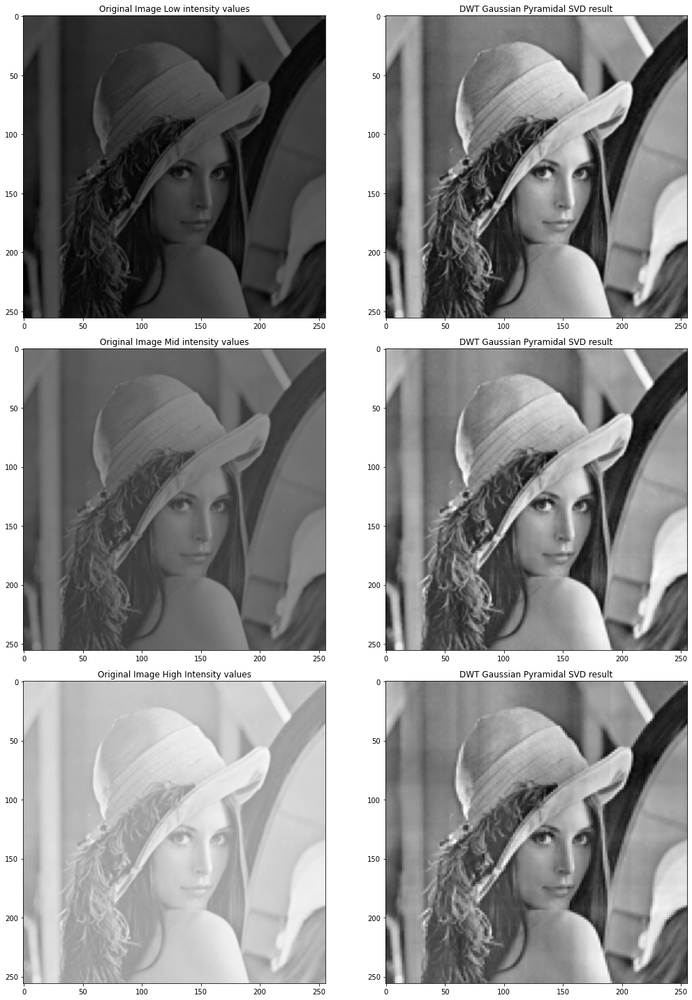

In [ ]:
plt.figure(figsize=(15,20))
plt.subplot(3, 2, 2)
plt.imshow(img_1, cmap="gray")
plt.title("DWT Gaussian Pyramidal SVD result")

plt.subplot(3, 2, 1)
plt.imshow(lena_rgb_1)
plt.title("Original Image Low intensity values")

plt.subplot(3, 2, 4)
plt.imshow(img_2, cmap="gray")
plt.title("DWT Gaussian Pyramidal SVD result")

plt.subplot(3, 2, 3)
plt.imshow(lena_rgb_2)
plt.title("Original Image Mid intensity values")

plt.subplot(3, 2, 6)
plt.imshow(img_3, cmap="gray")
plt.title("DWT Gaussian Pyramidal SVD result")

plt.subplot(3, 2, 5)
plt.imshow(lena_rgb_3)
plt.title("Original Image High Intensity values")

plt.tight_layout()

### Laplacian Pyramids SVD DWT

In [74]:
class DWTSVDLaplacianPyramidal(Base):
    def apply_enhancement(self, img):
        scaling_factor = 255.0 / img.max()
        hist_img = cv2.equalizeHist(np.uint8(img * scaling_factor)) / scaling_factor

        coeffs2_hist = pywt.dwt2(hist_img, "bior1.3")
        LL_hist, _ = coeffs2_hist

        coeffs2 = pywt.dwt2(img, "bior1.3")
        LL, (LH, HL, HH) = coeffs2

        U, s, Vth = np.linalg.svd(LL)
        Ul, sl, Vlth = np.linalg.svd(LL_hist)

        E = np.max(sl) / np.max(s)
        alpha = (E + 1 / E) / 4
        S = alpha * ((E * s) + (sl / E))
        sigma = np.diag(S)

        enhanced_LL = U @ sigma @ Vth

        coeffs2 = enhanced_LL, (LH, HL, HH)
        enhanced_img = pywt.idwt2(coeffs2, "bior1.3")
        return enhanced_img

    def transform(self, img):
        if img.size == 1 or self.stage == 0:
            return self.apply_enhancement(img)
        self.stage -= 1
        img_pyramid = tuple(pyramids.pyramid_laplacian(img))[1]
        
        temp = self.transform(img_pyramid)

        res = pyramids.pyramid_expand(temp, sigma=None)
        ret = (res + img) / 2 # equal contrib for now
        ret = self.apply_enhancement(ret)
        ret = ret[:img.shape[0], :img.shape[1]]
        return ret

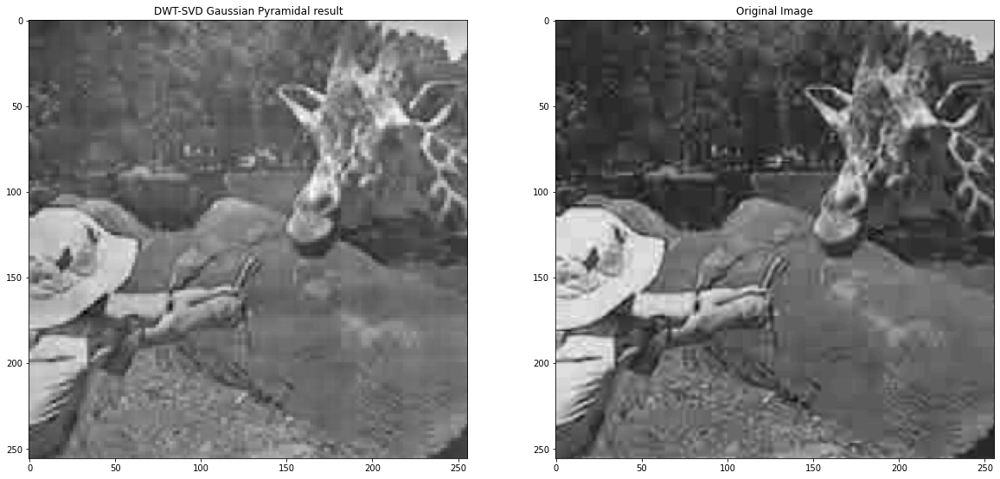

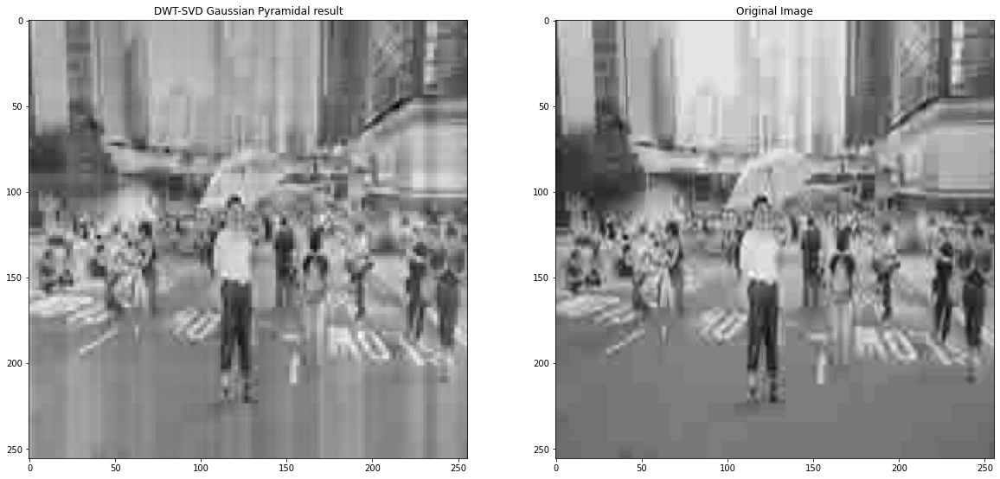

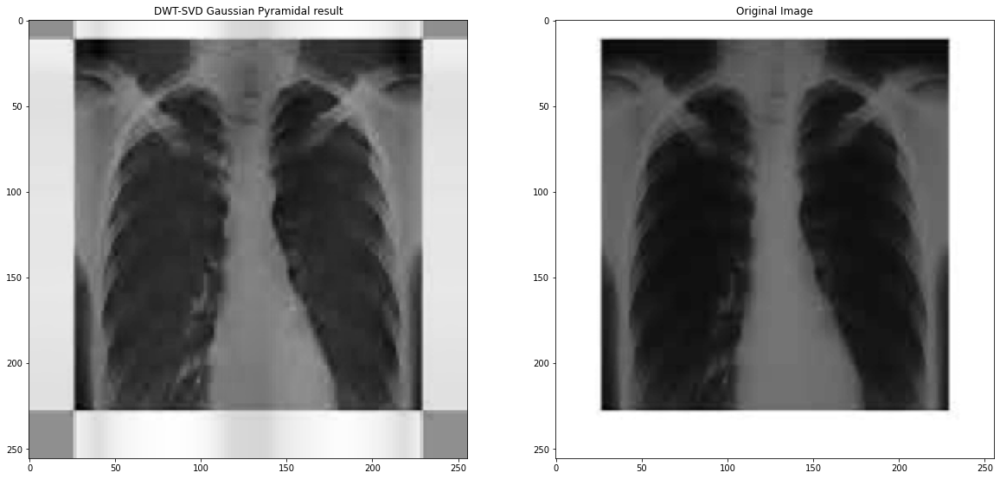

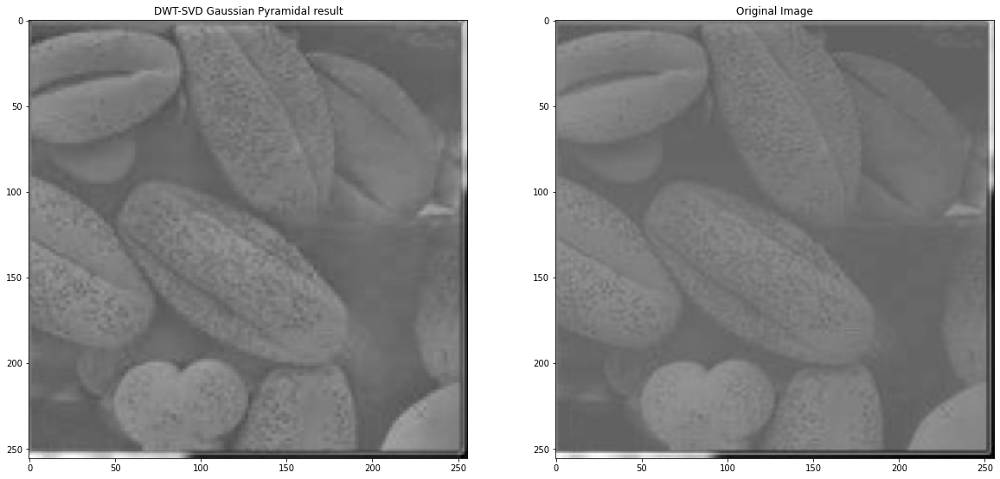

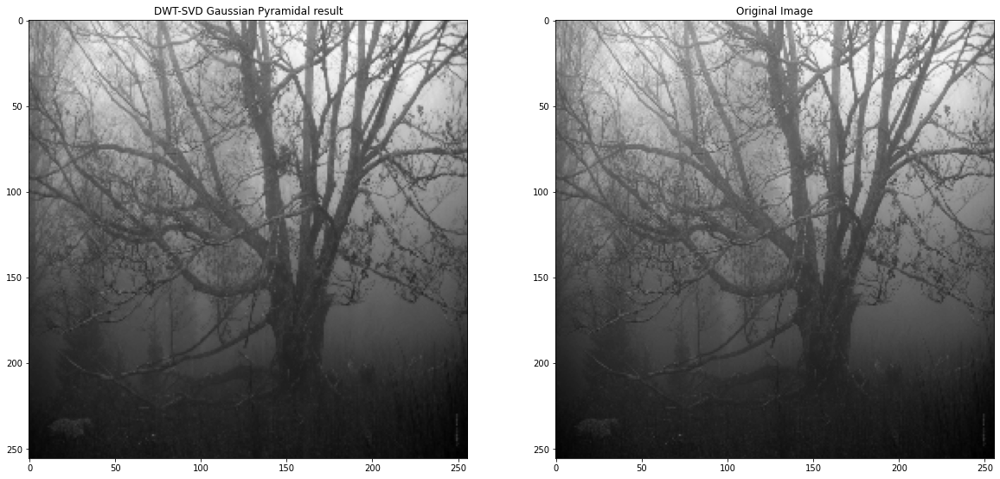

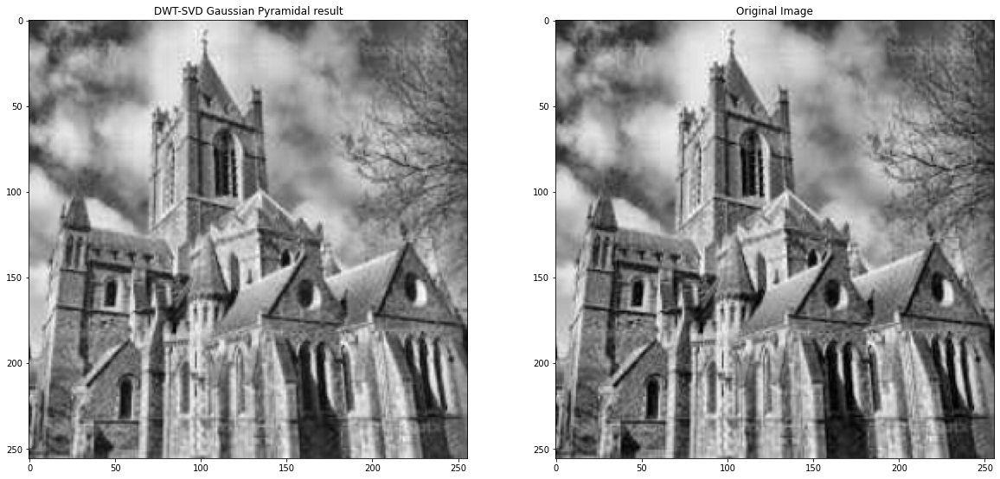

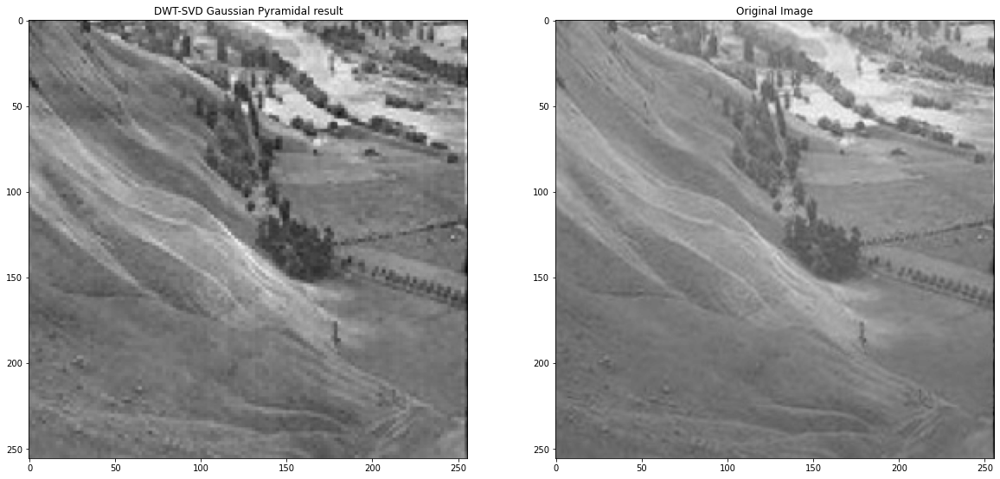

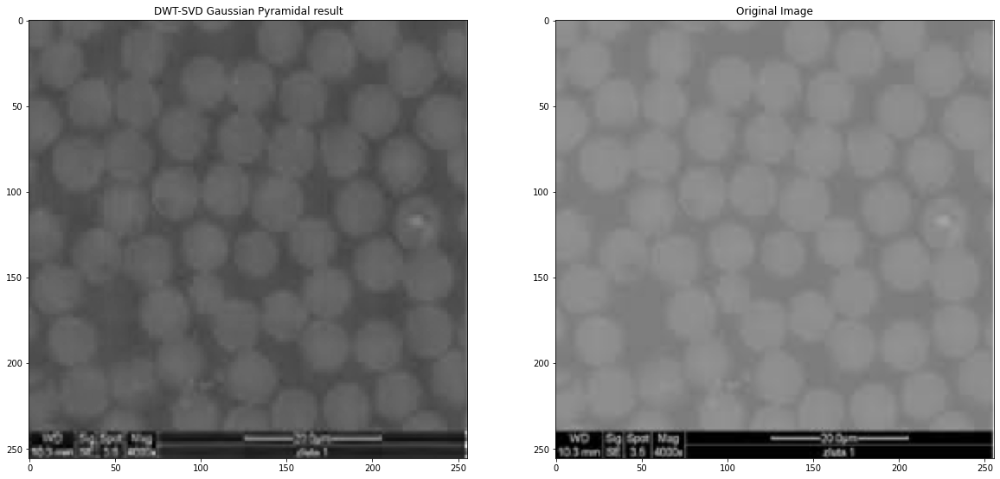

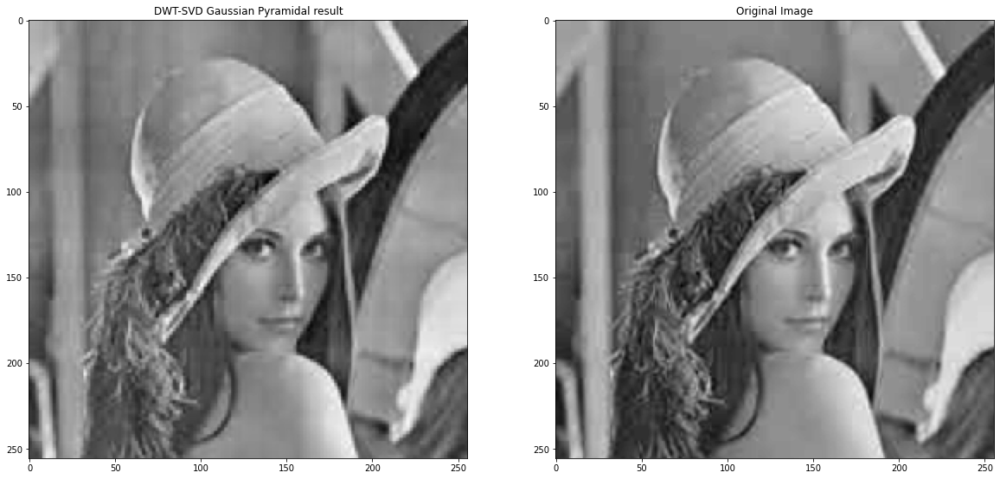

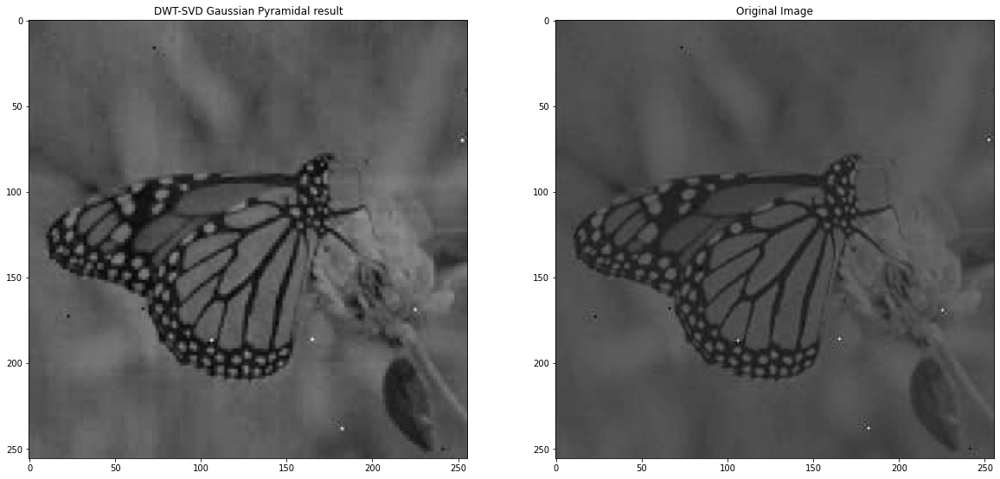

In [75]:
for img in image_dataset:
    model = DWTSVDLaplacianPyramidal(img, 2)
    model.get_result()

    plt.figure(figsize=(20,20))
    plt.subplot(1, 2, 1)
    plt.imshow(model.result, cmap="gray")
    plt.title("DWT-SVD Gaussian Pyramidal result")

    plt.subplot(1, 2, 2)
    plt.imshow(model.img, cmap="gray")
    plt.title("Original Image")

### Generating low contrast images

In [ ]:
lena_bad_1 = linContrastStretching(lena, 0, 30)
lena_bad_2 = linContrastStretching(lena, 120, 150)
lena_bad_3 = linContrastStretching(lena, 225, 255)

lena_rgb_1 = np.stack([lena_bad_1, lena_bad_1, lena_bad_1], axis=2)
lena_rgb_2 = np.stack([lena_bad_2, lena_bad_2, lena_bad_2], axis=2)
lena_rgb_3 = np.stack([lena_bad_3, lena_bad_3, lena_bad_3], axis=2)

### Applying the technique

In [ ]:
model_1_lap = DWTLaplacianPyramidalSVD(lena_bad_1, 6)
model_2_lap = DWTLaplacianPyramidalSVD(lena_bad_2, 6)
model_3_lap = DWTLaplacianPyramidalSVD(lena_bad_3, 6)

img_1 = model_1_lap.get_result()
img_2 = model_2_lap.get_result()
img_3 = model_3_lap.get_result()

### Showing the Results

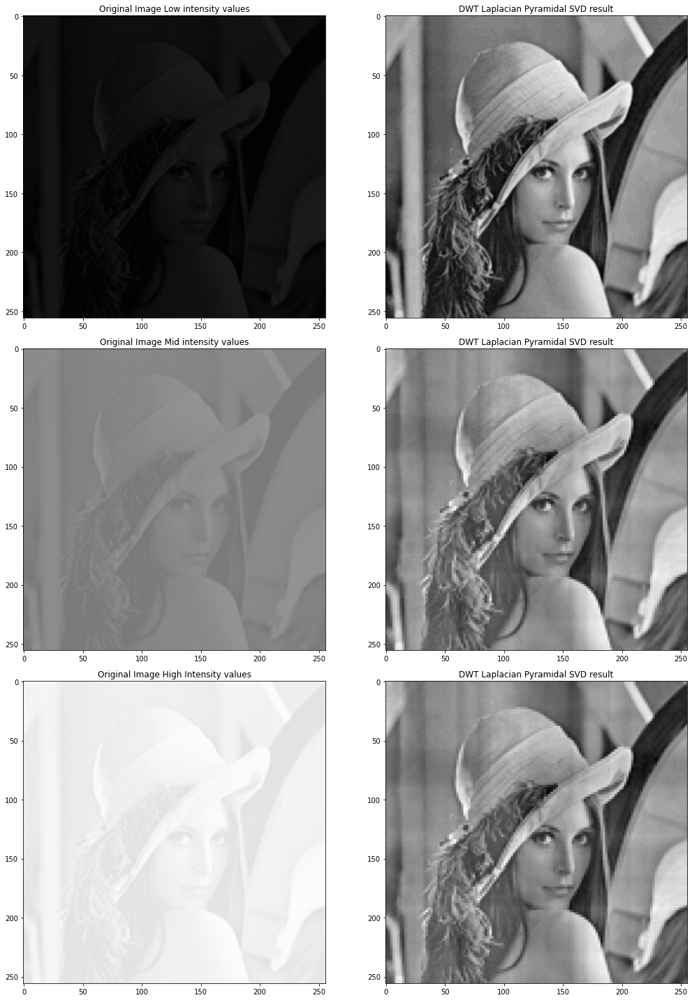

In [ ]:
plt.figure(figsize=(15,20))
plt.subplot(3, 2, 1)
plt.imshow(lena_rgb_1)
plt.title("Original Image Low intensity values")

plt.subplot(3, 2, 2)
plt.imshow(img_1, cmap="gray")
plt.title("DWT Laplacian Pyramidal SVD result")

plt.subplot(3, 2, 3)
plt.imshow(lena_rgb_2)
plt.title("Original Image Mid intensity values")

plt.subplot(3, 2, 4)
plt.imshow(img_2, cmap="gray")
plt.title("DWT Laplacian Pyramidal SVD result")

plt.subplot(3, 2, 5)
plt.imshow(lena_rgb_3)
plt.title("Original Image High Intensity values")

plt.subplot(3, 2, 6)
plt.imshow(img_3, cmap="gray")
plt.title("DWT Laplacian Pyramidal SVD result")

plt.tight_layout()

### Testing Gaussian pyramid for DCT SVD 

In [ ]:
def normalize(img):
    mx = np.amax(img)
    img /= mx
    img *= 255
    img = img.astype(np.uint8)
    return img

In [ ]:
# image = cv2.imread('images/butter.jfif',0)
# image = cv2.resize(image, (256,256))
image = butterfly
# image = lena
rows, cols = image.shape
pyramid = tuple(pyramid_gaussian(image, downscale=2))

combine = []

for p in pyramid[0:]:
    
    p = normalize(p)
    p_dct = dct2d(p)
    org_dct = p_dct.copy()
#     org_dct.append(p_dct)
    h,w = p_dct.shape
    ll = p_dct[:h//2, :w//2].copy()
    p_dct[:,:] = 0
    p_dct[:h//2, :w//2] = ll
    p_ll = idct2d(p_dct)
    
    ghe_p  = cv2.equalizeHist(p_ll.astype("uint8"))
    
    u_p, sigma_p, vt_p = np.linalg.svd(p_ll)
    u_ghe_p, sigma_ghe_p, vt_ghe_p = np.linalg.svd(ghe_p)

    max_low_subband_cap = np.amax(sigma_ghe_p)
    max_low_subband = np.amax(sigma_p)

    epsilon = max_low_subband_cap/max_low_subband
    alpha = (epsilon + 1/epsilon)/4

    sigma = alpha * (epsilon*sigma_p + sigma_ghe_p/epsilon)
    sigma_new = np.zeros((sigma.shape[0], sigma.shape[0]))
    for i in range(sigma.shape[0]):
        sigma_new[i][i] = sigma[i]
    
    reconstructed_img = (u_p @ sigma_new @ vt_p)
    reconstructed_img[reconstructed_img > 255] = 255
    reconstructed_img = reconstructed_img.astype(np.uint8)
    rec_dct = dct2d(reconstructed_img(6.897597669119064, 14.923425, 7.530133))
    org_dct[:h//2, :w//2] = rec_dct[:h//2, :w//2]
    enhanced_img = idct2d(org_dct)
    combine.append(enhanced_img)


/tmp/ipykernel_7074/3874618744.py:30: RuntimeWarning: invalid value encountered in double_scalars
  epsilon = max_low_subband_cap/max_low_subband


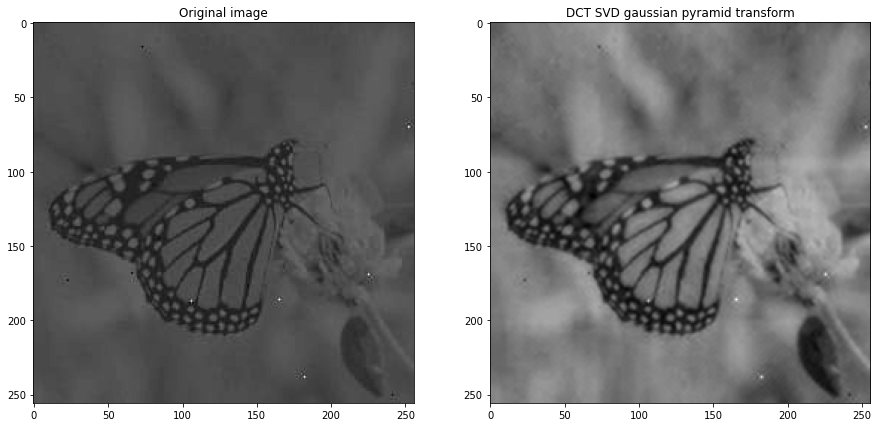

In [ ]:
output = np.zeros((image.shape), dtype=np.float32)
for i in range(1,len(combine)):
    factor = 2**i
    combine[i] = pyramids.pyramid_expand(combine[i], upscale = factor)
    output += (1/factor)*combine[i]

output += combine[0]
output = normalize(output)

plt.figure(figsize=(15,15))
plt.subplot(1, 2, 1)
plt.imshow(image, cmap="gray")
plt.title('Original image')
plt.subplot(1, 2, 2)
plt.imshow(output, cmap="gray")
plt.title('DCT SVD gaussian pyramid transform');

### EME 

In [ ]:
def EME(img,l=8):

    img=img.astype('float32')

    img[img<0]=1
    ans=0
    blocks=(img.shape[0]*img.shape[1])//(l*l)
    for i in range(0,img.shape[0],l):
        for j in range(0,img.shape[1],l):
            end_i=i+l
            end_j=j+l
            if end_i>img.shape[0]:
                end_i=img.shape[0]-1
            if end_j>img.shape[1]:
                end_j=img.shape[1]-1

            mx=img[i:end_i,j:end_j].max()
            mn = img[i:end_i, j:end_j].min()
            if mn==0:
                mn=1
            if mx==0:
                mx=1

            ans+=20*(np.log10(mx/mn))

    ans=ans/blocks

    mean=np.average(img)
    std_dev=np.std(img)

    return ans,mean,std_dev

In [ ]:
model_1_lap = DWTLaplacianPyramidalSVD(butterfly, 6)
img_laplacian = model_1_lap.get_result()

model_1 = DWTGaussianPyramidalSVD(butterfly, 6)
img_gaussian = model_1.get_result()

model = DWTSVD(butterfly, 6)
img_SVDDWT = model.get_result()

In [ ]:
print(EME(lena_bad_1))
print(EME(img_laplacian))
print(EME(img_gaussian))
print(EME(img_SVDDWT))

(1.8553680657078075, 77.83446, 9.921558)
(4.900022905885635, 49.892483, 13.124425)
(4.881829321820987, 49.965668, 13.16336)
(4.858586245218248, 100.19137, 26.237226)


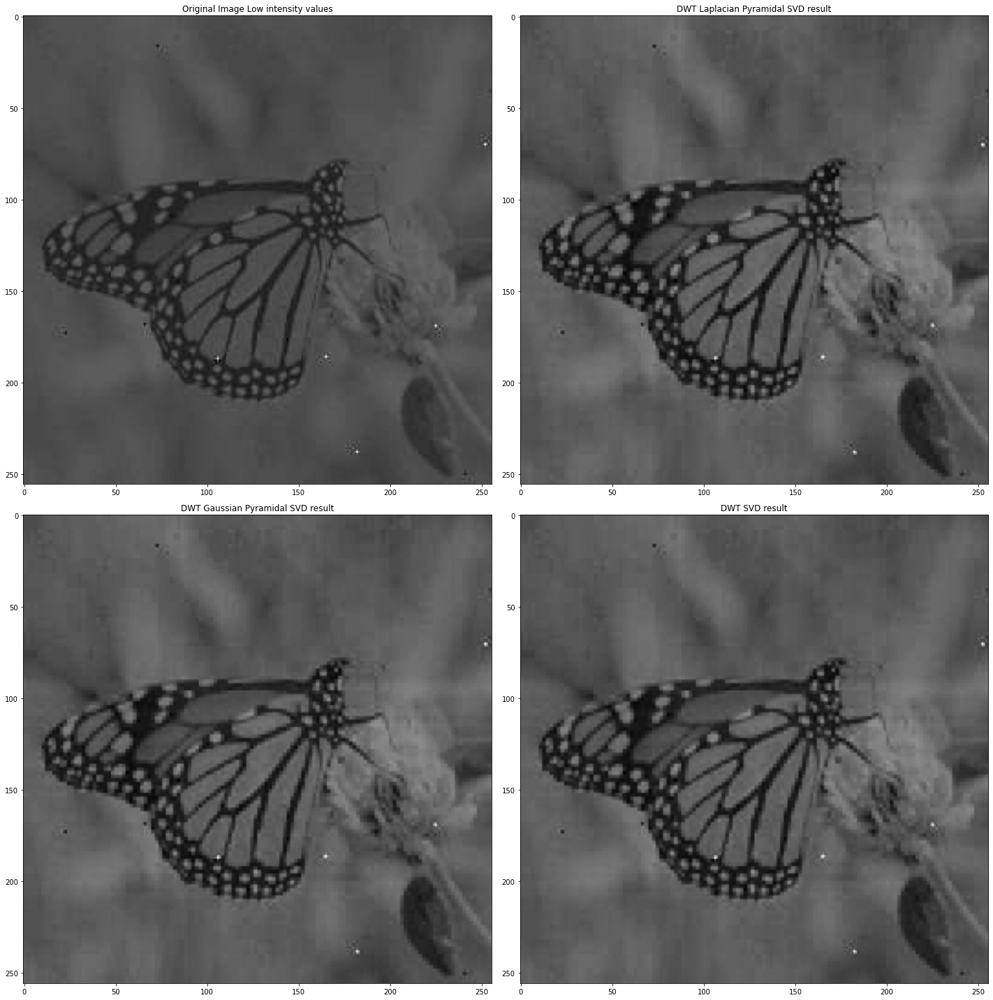

In [ ]:
plt.figure(figsize=(20, 20))
plt.subplot(2, 2, 1)
plt.imshow(lena_bad_1,cmap='gray')
plt.title("Original Image Low intensity values")

plt.subplot(2, 2, 2)
plt.imshow(img_laplacian, cmap="gray")
plt.title("DWT Laplacian Pyramidal SVD result")

plt.subplot(2, 2, 3)
plt.imshow(img_gaussian,cmap='gray')
plt.title("DWT Gaussian Pyramidal SVD result")

plt.subplot(2, 2, 4)
plt.imshow(img_SVDDWT, cmap="gray")
plt.title("DWT SVD result")


plt.tight_layout()


 |  <div style="width:400px">Technique</div>     | <div style="width:400px">EME</div>   |  <div style="width:400px">MEAN INTENSITY</div>   |<div style="width:400px">STD-DEVIATION</div>   |   
| :---:        |:----:|    :---: | :---:      |
| ORIGINAL IMAGE      | 1.8553680657078075    |  77.83446    |   9.921558 |
| DWT LAPLACIAN PYRAMIDAL TRANSFORM  | 4.900022905885635        |  49.892483      | 13.124425|
| DWT GAUSSIAN PYRAMIDAL TRANSFORM  | 4.881829321820987       |  49.965668     |  13.16336  |
| DWT SVD TRANSFORM   | 4.858586245218248      |  100.19137     | 26.237226  |



















## EXPALNATION
### Here we can see that EME values which is a measure of level of contrast in the image . As we can see that the EME of all the images except the original image is larger than that of original image , which indicates that contrast has happened and also we can clearly see grom the test results.

### Based on the values of EME of different transforms we can see that DWT LAPLACIAN PYRAMIDAL TRANSFORM works better than DWT GAUSSIAN PYRAMIDAL TRANSFORM works better than DWT SVD TRANSFORM